## Objective: 
In this notebook, the given topics have been covered:

    - Data Preprocessing
    - EDA 
    - KNN
    - Decision Tree 
    - SMOTE

### Dataset Overview:
    The dataset comprises several features:
    - Booking_ID: unique identifier of each booking
    - no_of_adults: Number of adults
    - no_of_children: Number of Children
    - no_of_weekend_nights: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
    - no_of_week_nights: Number of week nights (Monday to Friday) the guest stayed or booked to stay at the hotel
    - type_of_meal_plan: Type of meal plan booked by the customer:
    - required_car_parking_space: Does the customer require a car parking space? (0 - No, 1- Yes)
    - room_type_reserved: Type of room reserved by the customer. The values are ciphered 
    (encoded) by INN Hotels.
    - lead_time: Number of days between the date of booking and the arrival date
    - arrival_year: Year of arrival date
    - arrival_month: Month of arrival date
    - arrival_date: Date of the month
    - market_segment_type: Market segment designation.
    - repeated_guest: Is the customer a repeated guest? (0 - No, 1- Yes)
    - no_of_previous_cancellations: Number of previous bookings that were canceled by the customer prior to the current booking
    - no_of_previous_bookings_not_canceled: Number of previous bookings not canceled by the customer prior to the current booking
    - avg_price_per_room: Average price per day of the reservation; prices of the rooms are dynamic. (in euros)
    - no_of_special_requests: Total number of special requests made by the customer (e.g. high floor, view from the room, etc)
    - booking_status: Flag indicating if the booking was canceled or not.


In [4]:
pip install ydata-profiling

  Obtaining dependency information for ydata-profiling from https://files.pythonhosted.org/packages/a2/19/c58a6c22a04806c70802518eaf70866e5633fe47e671ded361295dfaf839/ydata_profiling-4.6.4-py2.py3-none-any.whl.metadata
  Using cached visions-0.7.5-py3-none-any.whl (102 kB)
  Obtaining dependency information for phik<0.13,>=0.11.1 from https://files.pythonhosted.org/packages/95/e3/250ce99ed761389028543fcb876176ba619f6bf387d6cce3bab736bd92cc/phik-0.12.4-cp311-cp311-win_amd64.whl.metadata
  Using cached ImageHash-4.3.1-py2.py3-none-any.whl (296 kB)
  Obtaining dependency information for wordcloud>=1.9.1 from https://files.pythonhosted.org/packages/f5/b0/247159f61c5d5d6647171bef84430b7efad4db504f0229674024f3a4f7f2/wordcloud-1.9.3-cp311-cp311-win_amd64.whl.metadata
  Using cached wordcloud-1.9.3-cp311-cp311-win_amd64.whl.metadata (3.5 kB)
   ---------------------------------------- 0.0/357.8 kB ? eta -:--:--
   - -------------------------------------- 10.2/357.8 kB ? eta -:--:--
   --- ----

In [1]:
#%matplotlib notebook 

import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

from ydata_profiling import ProfileReport
import pandas as pd
import numpy as np

In [2]:
data = pd.read_csv("Hotel Reservations.csv")
data.head()


,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled


### Load the dataset

## Analyze the original data

In [4]:
profile = ProfileReport(data)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

After inspecting the dataset, here are the findings:

**Statistical Summary:**

    1. The dataset seems to have reasonable values in most columns.
    2. The maximum number of children in a booking is 10, which could be unusual but not necessarily incorrect.
    3. There might be outliers but are still within plausible limits.
    4. The average price per room has a wide range, with a maximum of 540, which could indicate premium bookings or special room types.

**Duplicates:** There are no duplicate entries in the dataset.


## Exploratory Data Analysis (EDA)


In [5]:
df = data #Copying the original data to df for EDA

    1. What is the distribution of the number of adults and children in bookings?


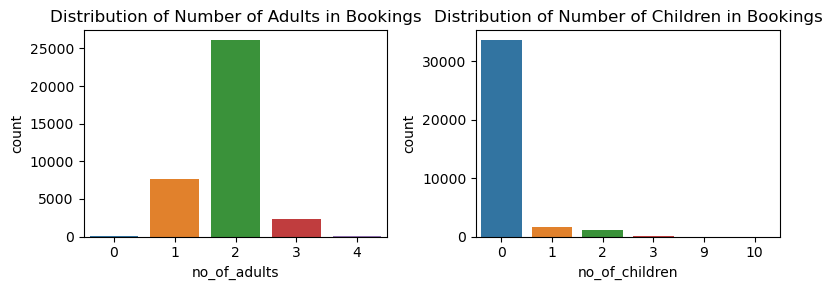

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns


# Question 1: Distribution of the number of adults and children in bookings

plt.figure(figsize=(8, 3))

# Plot for the number of adults
plt.subplot(1, 2, 1)
sns.countplot(x='no_of_adults', data=df)
plt.title('Distribution of Number of Adults in Bookings')

# Plot for the number of children
plt.subplot(1, 2, 2)
sns.countplot(x='no_of_children', data=df)
plt.title('Distribution of Number of Children in Bookings')

plt.tight_layout()
plt.show()


The visualizations provide insights into the distribution of the number of adults and children in bookings:

**Number of Adults:** Most bookings are made for two adults, followed by bookings for one adult. Bookings for three or four adults are less common.

**Number of Children:** The majority of bookings involve no children. Bookings with one or two children are less frequent, and more than two children are rare.

    2. How does the lead time affect cancellation rates?


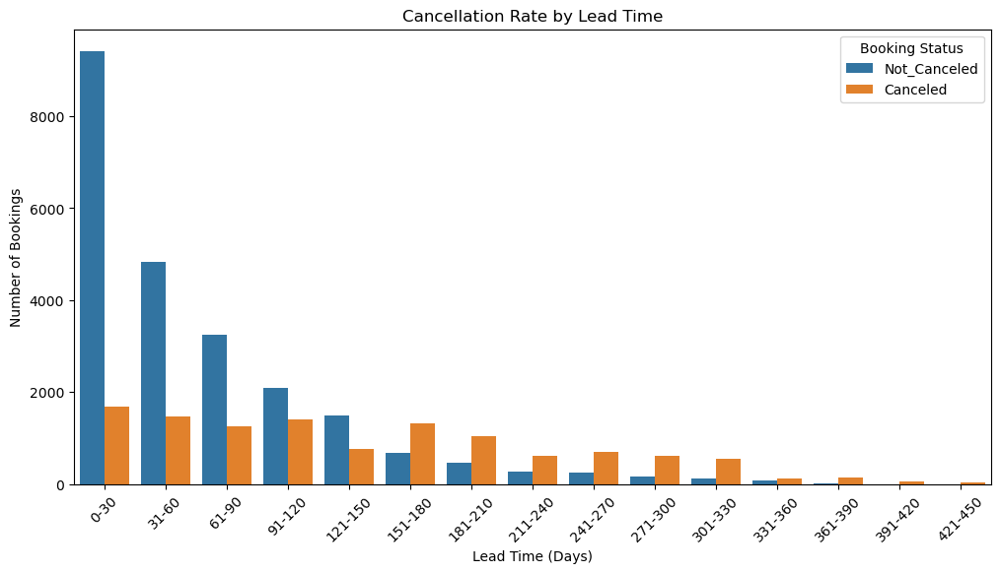

In [5]:
# Question 2: How does the lead time affect cancellation rates?

plt.figure(figsize=(12, 6))

# Creating a new column categorizing lead time into bins for easier visualization
df['lead_time_category'] = pd.cut(df['lead_time'], bins=[0, 30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360, 390, 420, 450], labels=['0-30', '31-60', '61-90', '91-120', '121-150', '151-180', '181-210', '211-240', '241-270', '271-300', '301-330', '331-360', '361-390', '391-420', '421-450'])

# Plotting
sns.countplot(x='lead_time_category', hue='booking_status', data=df)
plt.xticks(rotation=45)
plt.title('Cancellation Rate by Lead Time')
plt.xlabel('Lead Time (Days)')
plt.ylabel('Number of Bookings')
plt.legend(title='Booking Status')

plt.show()


The visualization illustrates the cancellation rate by lead time:

    Bookings with a shorter lead time (0-30 days) have a significantly lower cancellation rate compared to those with longer lead times.
    As the lead time increases, the cancellation rate generally tends to increase. This trend is particularly noticeable in lead times ranging from 31 to 180 days.
    Beyond 180 days, while the total number of bookings decreases, the proportion of cancellations remains relatively high.
    This suggests that longer lead times are associated with a higher likelihood of cancellations.

    3. What is the trend of bookings over different months of the year?


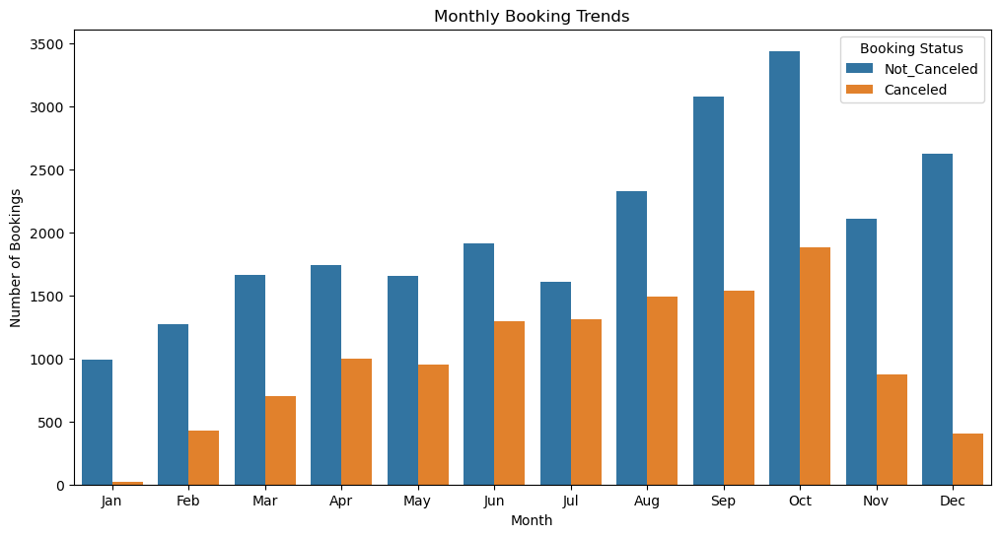

In [6]:
# Question 3: Trend of bookings over different months of the year

plt.figure(figsize=(12, 6))

# Mapping numbers to month names for better readability
months = {1: 'Jan', 2: 'Feb', 3: 'Mar', 4: 'Apr', 5: 'May', 6: 'Jun', 7: 'Jul', 8: 'Aug', 9: 'Sep', 10: 'Oct', 11: 'Nov', 12: 'Dec'}
df['arrival_month_name'] = df['arrival_month'].map(months)

# Plotting
sns.countplot(x='arrival_month_name', hue='booking_status', data=df, order=list(months.values()))
plt.title('Monthly Booking Trends')
plt.xlabel('Month')
plt.ylabel('Number of Bookings')
plt.legend(title='Booking Status')

plt.show()


The monthly booking trends show the following patterns:

**Peak Seasons:** The highest number of bookings occur in the months of July and August, indicating a peak season likely due to summer vacations.
**Cancellation Rates:** The cancellation rate also appears to be higher during these peak months, which might be due to the increased volume of bookings.
**Low Season:** The months with the fewest bookings are November, January, and February, suggesting a low season during late fall and winter.

## Data Preprocessing

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Booking_ID                            36275 non-null  object 
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   type_of_meal_plan                     36275 non-null  object 
 6   required_car_parking_space            36275 non-null  int64  
 7   room_type_reserved                    36275 non-null  object 
 8   lead_time                             36275 non-null  int64  
 9   arrival_year                          36275 non-null  int64  
 10  arrival_month                         36275 non-null  int64  
 11  arrival_date   

In [4]:
data.head(2)

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled


#### Drop Booking id as it has nothing to do with prediction

In [5]:
data = data.drop(columns=['Booking_ID'])

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 18 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   no_of_adults                          36275 non-null  int64  
 1   no_of_children                        36275 non-null  int64  
 2   no_of_weekend_nights                  36275 non-null  int64  
 3   no_of_week_nights                     36275 non-null  int64  
 4   type_of_meal_plan                     36275 non-null  object 
 5   required_car_parking_space            36275 non-null  int64  
 6   room_type_reserved                    36275 non-null  object 
 7   lead_time                             36275 non-null  int64  
 8   arrival_year                          36275 non-null  int64  
 9   arrival_month                         36275 non-null  int64  
 10  arrival_date                          36275 non-null  int64  
 11  market_segment_

## Encoding

    Label encoding: it is used for ordinal data.
    One-hot encoding: it is used for nominal data.

why not one-hot encoding?
    
    1. increase in feature count because unique values are greater than 2 ( not binary)
    2. increase in feature will complex the data and modeling.

In [7]:
import pandas as pd

# Assuming your dataset is loaded into a variable named 'data'

# Get unique values in the 'type_of_meal_plan' column
unique_meal_plans = data['type_of_meal_plan'].unique()

# Create an empty DataFrame to store the results
meal_plan_stats = pd.DataFrame(columns=['Meal_Plan', 'Min_Avg_Price', 'Max_Avg_Price', 'Mean_Avg_Price'])

# Iterate over each unique value
for meal_plan in unique_meal_plans:
    subset_data = data[data['type_of_meal_plan'] == meal_plan]
    
    # Calculate statistics
    min_avg_price = subset_data['avg_price_per_room'].min()
    max_avg_price = subset_data['avg_price_per_room'].max()
    mean_avg_price = subset_data['avg_price_per_room'].mean()
    
    # Append to the DataFrame
    meal_plan_stats = pd.concat([meal_plan_stats, pd.DataFrame({
        'Meal_Plan': [meal_plan],
        'Min_Avg_Price': [min_avg_price],
        'Max_Avg_Price': [max_avg_price],
        'Mean_Avg_Price': [mean_avg_price]
    })], ignore_index=True)

# Display the resulting DataFrame
meal_plan_stats

,Meal_Plan,Min_Avg_Price,Max_Avg_Price,Mean_Avg_Price
0,Meal Plan 1,0.0,540.0,103.593139
1,Not Selected,0.0,204.0,94.908610
2,Meal Plan 2,0.0,365.0,115.306106
3,Meal Plan 3,0.0,206.0,41.200000


## room_type_reserved                    

In [8]:
import pandas as pd

# Get unique values in the 'room_type_reserved' column
unique_room_types = data['room_type_reserved'].unique()

# Create an empty DataFrame to store the results
room_type_stats = pd.DataFrame(columns=['Room_Type', 'Min_Avg_Price', 'Max_Avg_Price', 'Mean_Avg_Price'])

# Iterate over each unique value
for room_type in unique_room_types:
    subset_data = data[data['room_type_reserved'] == room_type]
    
    # Calculate statistics
    min_avg_price = subset_data['avg_price_per_room'].min()
    max_avg_price = subset_data['avg_price_per_room'].max()
    mean_avg_price = subset_data['avg_price_per_room'].mean()
    
    # Append to the DataFrame
    room_type_stats = pd.concat([room_type_stats, pd.DataFrame({
        'Room_Type': [room_type],
        'Min_Avg_Price': [min_avg_price],
        'Max_Avg_Price': [max_avg_price],
        'Mean_Avg_Price': [mean_avg_price]
    })], ignore_index=True)

# Display the resulting DataFrame
room_type_stats

,Room_Type,Min_Avg_Price,Max_Avg_Price,Mean_Avg_Price
0,Room_Type 1,0.0,540.00,95.918532
1,Room_Type 4,0.0,375.50,125.287317
2,Room_Type 2,0.0,284.10,87.848555
3,Room_Type 6,0.0,349.63,182.212836
4,Room_Type 5,0.0,250.00,123.733623
5,Room_Type 7,0.0,306.00,155.198291
6,Room_Type 3,0.0,130.00,73.678571


In [9]:
data['market_segment_type'].value_counts()            

market_segment_type
Online           23214
Offline          10528
Corporate         2017
Complementary      391
Aviation           125
Name: count, dtype: int64

In [10]:
data['booking_status'].value_counts()            

booking_status
Not_Canceled    24390
Canceled        11885
Name: count, dtype: int64

In [11]:
data[['type_of_meal_plan', 'room_type_reserved', 'market_segment_type', 'booking_status']]

,type_of_meal_plan,room_type_reserved,market_segment_type,booking_status
0,Meal Plan 1,Room_Type 1,Offline,Not_Canceled
1,Not Selected,Room_Type 1,Online,Not_Canceled
2,Meal Plan 1,Room_Type 1,Online,Canceled
3,Meal Plan 1,Room_Type 1,Online,Canceled
4,Not Selected,Room_Type 1,Online,Canceled
...,...,...,...,...
36270,Meal Plan 1,Room_Type 4,Online,Not_Canceled
36271,Meal Plan 1,Room_Type 1,Online,Canceled
36272,Meal Plan 1,Room_Type 1,Online,Not_Canceled
36273,Not Selected,Room_Type 1,Online,Canceled


#### Convert categorical variables (type_of_meal_plan, room_type_reserved, market_segment_type, booking_status ) into numerical formats using encoding techniques (e.g., one-hot encoding).


In [12]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
data['encoded_meal_plan'] = label_encoder.fit_transform(data['type_of_meal_plan'])
data['encoded_room_type_reserved'] = label_encoder.fit_transform(data['room_type_reserved'])
data['encoded_market_segment_type'] = label_encoder.fit_transform(data['market_segment_type'])
data['encoded_booking_status'] = label_encoder.fit_transform(data['booking_status'])

In [13]:
data.head(2)

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,...,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status,encoded_meal_plan,encoded_room_type_reserved,encoded_market_segment_type,encoded_booking_status
0,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,...,0,0,0,65.00,0,Not_Canceled,0,0,3,1
1,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,...,0,0,0,106.68,1,Not_Canceled,3,0,4,1


#### Drop type_of_meal_plan, room_type_reserved, market_segment_type, and booking_status columns from the original data

In [14]:
data = data.drop(columns=['type_of_meal_plan'])
data = data.drop(columns=['room_type_reserved'])
data = data.drop(columns=['market_segment_type'])
data = data.drop(columns=['booking_status'])

In [15]:
data.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,encoded_meal_plan,encoded_room_type_reserved,encoded_market_segment_type,encoded_booking_status
0,2,0,1,2,0,224,2017,10,2,0,0,0,65.00,0,0,0,3,1
1,2,0,2,3,0,5,2018,11,6,0,0,0,106.68,1,3,0,4,1
2,1,0,2,1,0,1,2018,2,28,0,0,0,60.00,0,0,0,4,0
3,2,0,0,2,0,211,2018,5,20,0,0,0,100.00,0,0,0,4,0
4,2,0,1,1,0,48,2018,4,11,0,0,0,94.50,0,3,0,4,0


In [16]:
data.shape

(36275, 18)

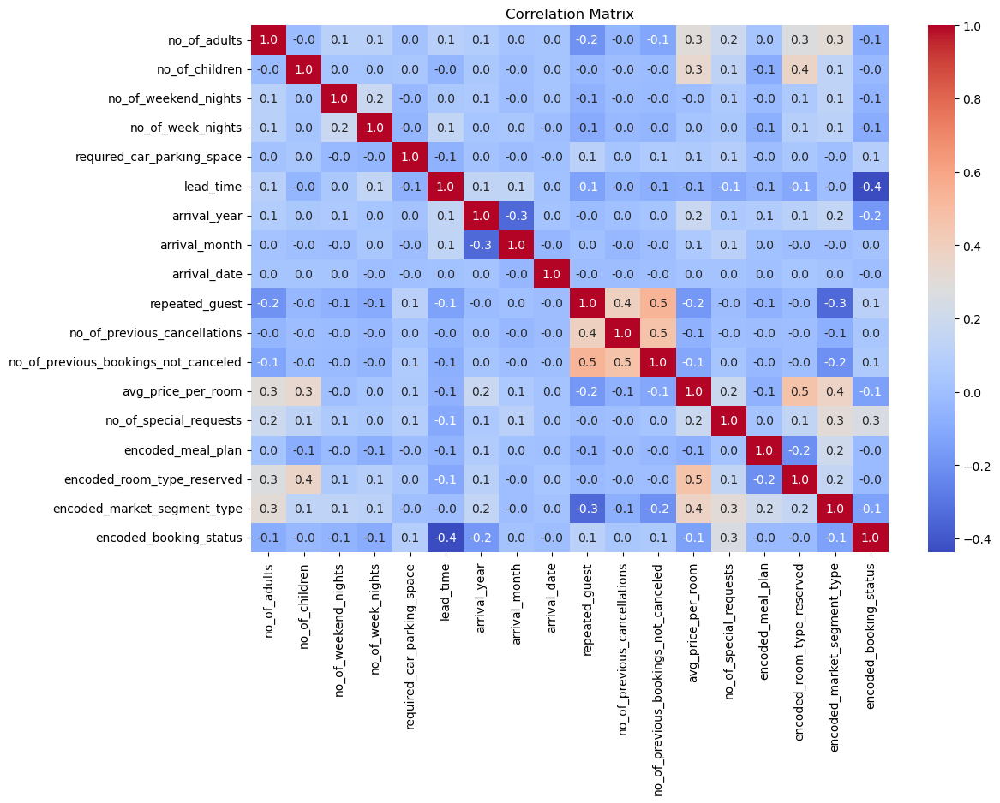

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Correlation matrix
correlation_matrix = data.corr()

# Plotting the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".1f")
plt.title('Correlation Matrix')
plt.show()


## KNN


2 categories:

    1. Red
    2. Blue
    

k=1

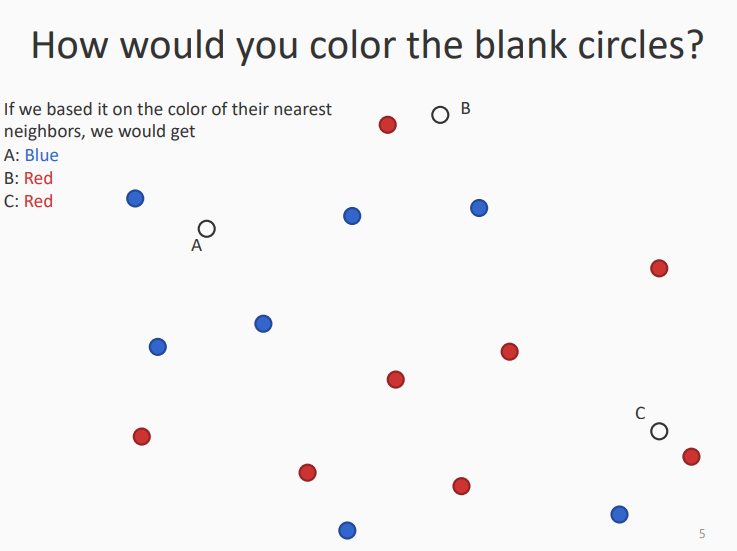

The K-Nearest Neighbors (KNN) algorithm is a simple, yet powerful machine learning algorithm used for both classification and regression tasks. Here's a step-by-step explanation of how KNN works, particularly in the context of your dataset:

### **Choose the Number of Neighbors (k)**
   - **k** is a hyperparameter that determines the number of nearest neighbors to include in the majority voting process.
   - There is no definitive rule for choosing **k**, but a common practice is to try various values and choose the one that works best. Typically, **k** is an odd number to prevent ties.
   - A small value of **k** can be noisy and lead to higher influence by outliers, whereas a larger **k** makes the boundaries between classes less distinct.

### **Select the Distance Metric**
   - Common distance metrics are Euclidean, Manhattan, and Minkowski. Euclidean distance is widely used for continuous variables.
   - The choice of distance metric depends on the type of data. For instance, Manhattan distance (sum of absolute differences) is often better for high-dimensional data.

### **Scaling the Features**
   - KNN is sensitive to the scale of the features because it relies on the distance between data points.
   - Features should be scaled (e.g., using StandardScaler) so that one feature doesn’t dominate the others in terms of its scale.

### **For Each Data Point in the Test Set:**
   - Calculate the distance from this test data point to all the points in the training set.
   - Sort these distances and identify the **k** nearest data points.
   - The predicted class (in case of classification) is the one that has the majority among these **k** neighbors.

### **Aggregate Voting (Classification)**
   - For classification, KNN assigns the class based on the majority vote of its nearest neighbors.
   - Each neighbor typically gets equal voting weight, but variations can give more weight to closer neighbors.

### **Evaluate the Model**
   - Use metrics like accuracy, precision, recall, and the confusion matrix to evaluate the performance of your KNN model.

Remember, the efficiency of KNN can be affected by the dataset size (large datasets can make KNN slow). Moreover, KNN can struggle with high dimensional data due to the curse of dimensionality.

    Step-1: Select the number K of the neighbors
    Step-2: Calculate the Euclidean distance between the new point and all the other points.
    
  $ \text{Euclidean Distance} = \sqrt{{(x_2 - x_1)^2 + (y_2 - y_1)^2 + (z_2 - z_1)^2 + \ldots}} $

    Step-3: Take the K nearest neighbors as per the calculated Euclidean distance.
    Step-4: Among these k neighbors, count the number of the data points in each category.
    Step-5: Assign the new data points to that category for which the number of the neighbor is maximum.


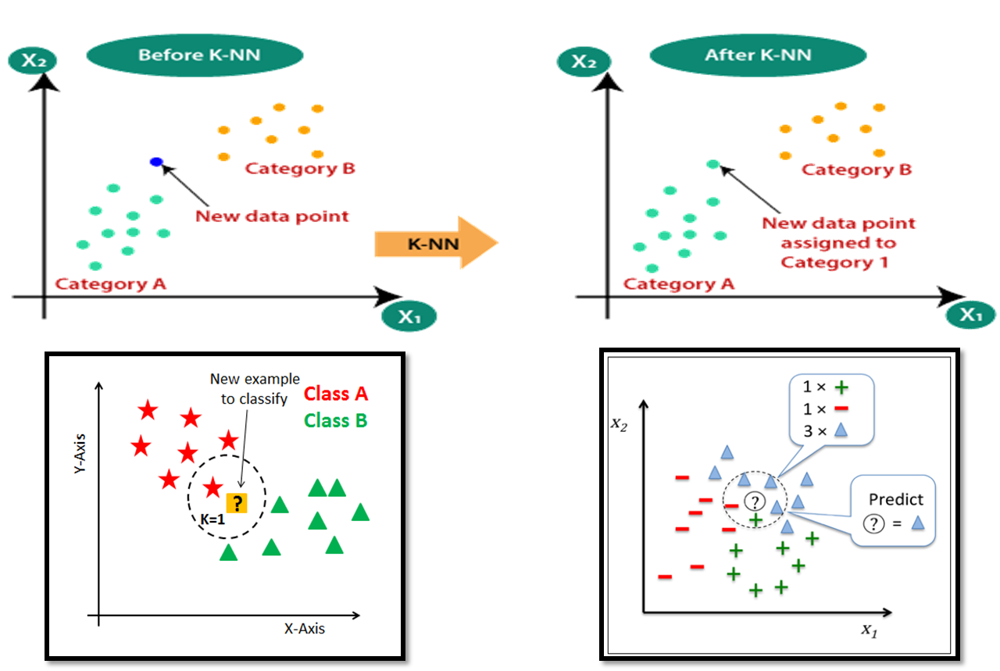

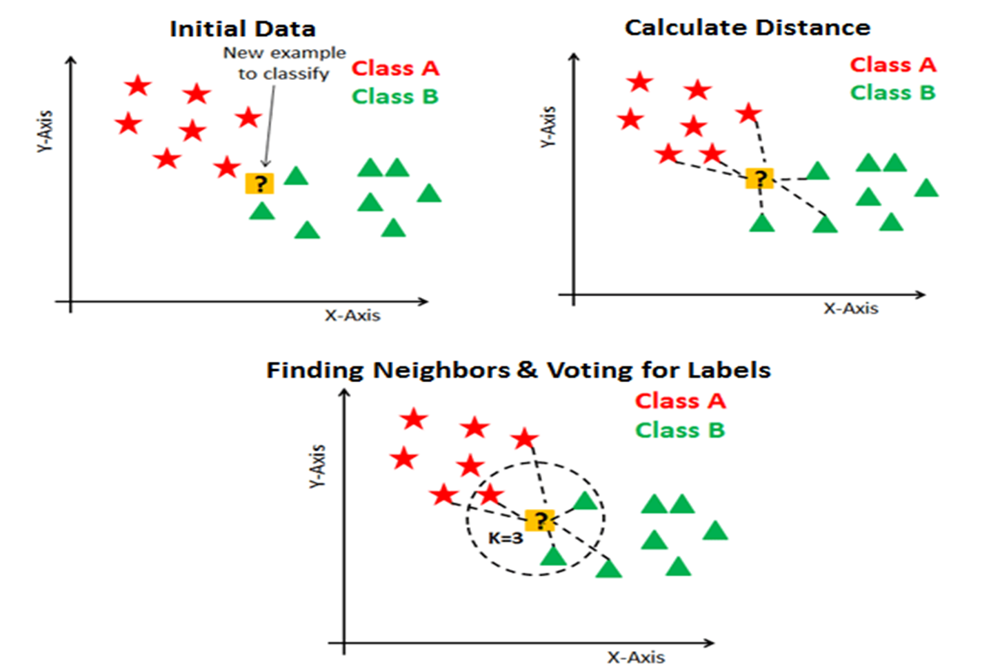

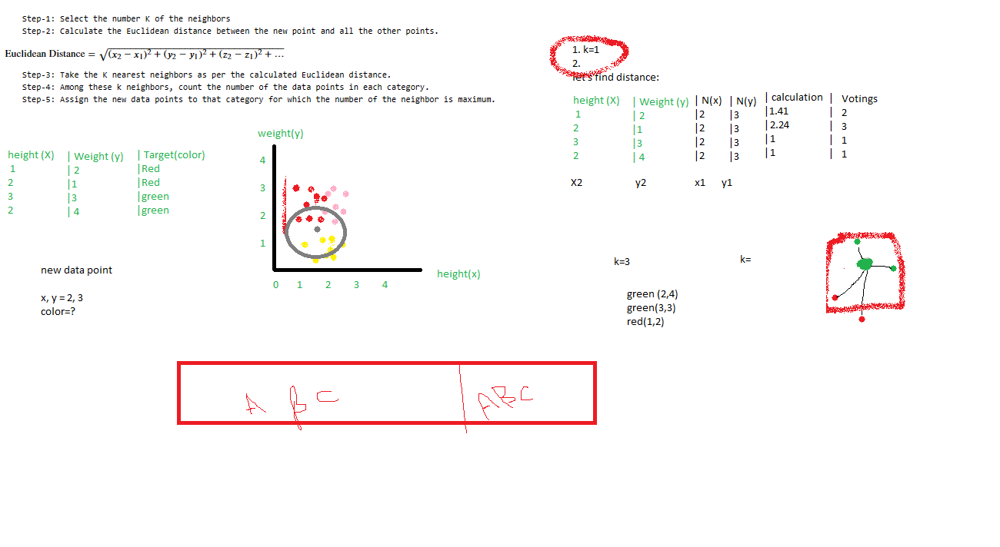

# Define Features and Target column

    1. Define x and y
    2. split into train and test
    3. model train
    4. model test
    5. evaluate

In [18]:
data.head(2)

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,encoded_meal_plan,encoded_room_type_reserved,encoded_market_segment_type,encoded_booking_status
0,2,0,1,2,0,224,2017,10,2,0,0,0,65.00,0,0,0,3,1
1,2,0,2,3,0,5,2018,11,6,0,0,0,106.68,1,3,0,4,1


In [19]:
X = data.drop('encoded_booking_status', axis=1)
y = data['encoded_booking_status']

## Standardize the Variables

Because the KNN classifier predicts the class of a given test observation by identifying the observations that are nearest to it, the scale of the variables matters. Any variables that are on a large scale will have a much larger effect on the distance between the observations, and hence on the KNN classifier, than variables that are on a small scale.

In [20]:
from sklearn.preprocessing import StandardScaler

In [21]:
scaler = StandardScaler()

In [22]:
scaler.fit(X)

StandardScaler()

In [23]:
scaled_features = scaler.transform(X)

In [24]:
scaled_features

array([[ 0.29889263, -0.26147045,  0.2174012 , ..., -0.49197217,
        -0.50641126, -0.81060135],
       [ 0.29889263, -0.26147045,  1.36599262, ...,  2.37030377,
        -0.50641126,  0.65669226],
       [-1.62897546, -0.26147045,  1.36599262, ..., -0.49197217,
        -0.50641126,  0.65669226],
       ...,
       [ 0.29889263, -0.26147045,  1.36599262, ..., -0.49197217,
        -0.50641126,  0.65669226],
       [ 0.29889263, -0.26147045, -0.93119021, ...,  2.37030377,
        -0.50641126,  0.65669226],
       [ 0.29889263, -0.26147045,  0.2174012 , ..., -0.49197217,
        -0.50641126, -0.81060135]])

In [25]:
df_feat = pd.DataFrame(scaled_features,columns=data.columns[:-1])
df_feat.head()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,encoded_meal_plan,encoded_room_type_reserved,encoded_market_segment_type
0,0.298893,-0.26147,0.217401,-0.144803,-0.178819,1.614896,-2.137469,0.839242,-1.555662,-0.16221,-0.063393,-0.087456,-1.095033,-0.78814,-0.491972,-0.506411,-0.810601
1,0.298893,-0.26147,1.365993,0.563972,-0.178819,-0.933701,0.467843,1.164990,-1.098013,-0.16221,-0.063393,-0.087456,0.092806,0.48376,2.370304,-0.506411,0.656692
2,-1.628975,-0.26147,1.365993,-0.853578,-0.178819,-0.980250,0.467843,-1.766747,1.419055,-0.16221,-0.063393,-0.087456,-1.237528,-0.78814,-0.491972,-0.506411,0.656692
3,0.298893,-0.26147,-0.931190,-0.144803,-0.178819,1.463610,0.467843,-0.789501,0.503757,-0.16221,-0.063393,-0.087456,-0.097567,-0.78814,-0.491972,-0.506411,0.656692
4,0.298893,-0.26147,0.217401,-0.853578,-0.178819,-0.433291,0.467843,-1.115250,-0.525952,-0.16221,-0.063393,-0.087456,-0.254312,-0.78814,2.370304,-0.506411,0.656692


In [26]:
scaled_data = pd.DataFrame({'Max': df_feat.head().max(), 'Min': df_feat.head().min()})
scaled_data

,Max,Min
no_of_adults,0.298893,-1.628975
no_of_children,-0.261470,-0.261470
no_of_weekend_nights,1.365993,-0.931190
no_of_week_nights,0.563972,-0.853578
required_car_parking_space,-0.178819,-0.178819
lead_time,1.614896,-0.980250
arrival_year,0.467843,-2.137469
arrival_month,1.164990,-1.766747
arrival_date,1.419055,-1.555662
repeated_guest,-0.162210,-0.162210


### Train Test Split

In [27]:
from sklearn.model_selection import train_test_split

In [28]:
X_train, X_test, y_train, y_test = train_test_split(scaled_features,y,
                                                    test_size=0.30)

In [30]:
# To know the other parameters like random_state and shuffle, run given code
#X_train, X_test, y_train, y_test = train_test_split?

## KNN Implementation

Remember that we are trying to come up with a model to predict whether someone will TARGET CLASS or not. We'll start with k=1.

In [31]:
from sklearn.neighbors import KNeighborsClassifier

In [32]:
knn = KNeighborsClassifier(n_neighbors=1)

In [33]:
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

In [34]:
pred = knn.predict(X_test)

### Confusion Matrix:

A confusion matrix is a table that describes the performance of a classification model. It shows the counts of True Positives (TP), True Negatives (TN), False Positives (FP), and False Negatives (FN). In a binary classification scenario (two classes: Positive and Negative), the confusion matrix looks like this:


\begin{array}{ccc}
& \text{Predicted Negative} & \text{Predicted Positive} \\
\text{Actual Negative} & TN & FP \\
\text{Actual Positive} & FN & TP \\
\end{array}

Here's a breakdown of each term:

- **True Positives (TP):** Instances correctly predicted as Positive.
- **True Negatives (TN):** Instances correctly predicted as Negative.
- **False Positives (FP):** Instances incorrectly predicted as Positive.
- **False Negatives (FN):** Instances incorrectly predicted as Negative.

### Classification Report:

A classification report provides key metrics for evaluating the performance of a classification model. It includes Precision, Recall, F1 Score, Support, and Accuracy. For a binary classification scenario:


\begin{array}{ccccccc}
& \text{Precision} & \text{Recall} & \text{F1 Score} & \text{Support} & \text{Accuracy} \\
\text{Positive Class} & \frac{TP}{TP + FP} & \frac{TP}{TP + FN} & \frac{2 \cdot \text{Precision} \cdot \text{Recall}}{\text{Precision} + \text{Recall}} & TP + FN & \frac{TP + TN}{TP + TN + FP + FN} \\
\text{Negative Class} & \frac{TN}{TN + FN} & \frac{TN}{TN + FP} & & TN + FP & \\
\end{array}


Here's a breakdown of each metric:

- **Precision:** Out of the predicted Positive instances, how many were truly Positive.
- **Recall:** Out of all the actual Positive instances, how many were correctly predicted as Positive.
- **F1 Score:** The harmonic mean of Precision and Recall, providing a balance between the two.
- **Support:** The number of actual instances for each class.
- **Accuracy:** Overall correctness of the model.

In a multiclass scenario, these metrics are usually calculated for each class, and the classification report includes a row for each class.

These metrics help in assessing the model's performance and understanding how well it distinguishes between different classes.

## Predictions and Evaluations

Let's evaluate our KNN model!

In [35]:
from sklearn.metrics import classification_report,confusion_matrix

In [36]:
print(confusion_matrix(y_test,pred))

[[2802  833]
 [ 861 6387]]


In [37]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.76      0.77      0.77      3635
           1       0.88      0.88      0.88      7248

    accuracy                           0.84     10883
   macro avg       0.82      0.83      0.83     10883
weighted avg       0.84      0.84      0.84     10883



In [38]:
#Training Accuracy
print(knn.score(X_train, y_train))

0.9929505356017644


In [39]:
#Testing Accuracy
print(knn.score(X_test, y_test))

0.8443443903335477


If model is overfit (training accuracy = 100 % while less testing accuracy):
    
    1. Change the k value
    2. add randomness or shuffle parameter in train_test_split
    3. cross validation
    

## Choosing a K Value

Let's go ahead and use the elbow method to pick a good K Value:

Maximum accuracy:- 0.8454470274740421 at K = 5


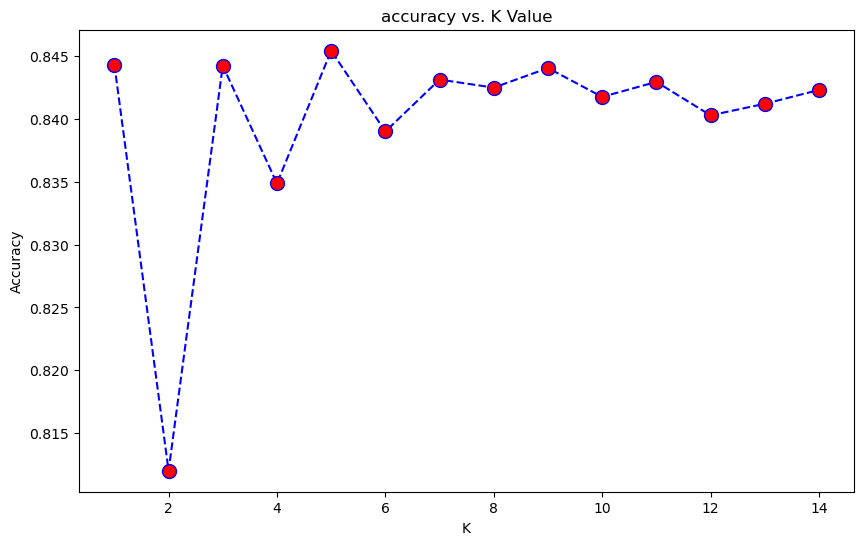

In [40]:
acc = []
# Will take some time
from sklearn import metrics
for i in range(1,15):
    neigh = KNeighborsClassifier(n_neighbors = i).fit(X_train,y_train)
    yhat = neigh.predict(X_test)
    acc.append(metrics.accuracy_score(y_test, yhat))

plt.figure(figsize=(10,6))
plt.plot(range(1,15),acc,color = 'blue',linestyle='dashed',
         marker='o',markerfacecolor='red', markersize=10)
plt.title('accuracy vs. K Value')
plt.xlabel('K')
plt.ylabel('Accuracy')
print("Maximum accuracy:-",max(acc),"at K =",acc.index(max(acc))+1)

In [41]:
knn = KNeighborsClassifier(n_neighbors=5)

knn.fit(X_train,y_train)
pred = knn.predict(X_test)

print(classification_report(y_test,pred))


              precision    recall  f1-score   support

           0       0.78      0.74      0.76      3635
           1       0.87      0.90      0.89      7248

    accuracy                           0.85     10883
   macro avg       0.83      0.82      0.82     10883
weighted avg       0.84      0.85      0.84     10883



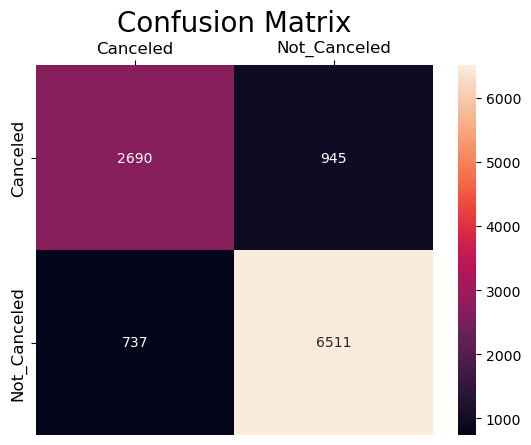

In [42]:
ax= plt.subplot()
sns.heatmap(confusion_matrix(y_test,pred), annot=True, ax = ax, fmt = 'g'); 
ax.set_title('Confusion Matrix', fontsize=20)

ax.xaxis.set_ticklabels(['Canceled', 'Not_Canceled'], fontsize = 12)
ax.xaxis.tick_top()

ax.yaxis.set_ticklabels(['Canceled', 'Not_Canceled'], fontsize = 12)
plt.show()

# Decision tree


1. **Step-1: Select a Feature to Split On:**
   - At the root of the tree, choose a feature from the dataset based on certain criteria (e.g., Gini impurity, information gain). This feature will be used to split the dataset into subsets.

2. **Step-2: Split the Data:**
   - Split the dataset into subsets based on the chosen feature. Each subset represents a branch of the tree.

3. **Step-3: Repeat for Each Subset:**
   - For each subset created by the split, repeat the process. Choose a new feature to split on, and create branches accordingly.

4. **Step-4: Stop Conditions:**
   - Continue splitting and creating branches until one of the stop conditions is met. Stop conditions might include reaching a certain depth, having a minimum number of samples in a node, or achieving pure subsets (all samples in a subset belong to the same class).

5. **Step-5: Assign Labels to Leaf Nodes:**
   - Once a stop condition is met, assign a label or class to each leaf node (the end points of the branches). This label is the predicted output for samples that reach that leaf.

6. **Step-6: Tree is Ready:**
   - The decision tree is now ready for making predictions. When a new sample is introduced, it follows the branches of the tree based on the feature values, and the prediction is the label assigned to the leaf node it reaches.

### Example: Decision Tree for Weather Decision

Consider building a decision tree to decide whether to play outside based on weather conditions:

```
Root Node: Is Weather Sunny?
   |
   ├── Yes --> Leaf Node: Play Outside
   |
   └── No --> Sub-Tree:
               |
               ├── Is Wind Strong?
               |     |
               |     ├── Yes --> Leaf Node: Play Inside
               |     |
               |     └── No --> Leaf Node: Play Outside
               |
               └── Another Splitting Feature...
```

In this example, the decision tree asks questions based on features (e.g., weather, wind) and guides the decision-making process until it reaches a conclusion (leaf node with a decision).

### Gini Impurity:

**Gini impurity is like a measure of how mixed up a group is.**

Imagine you have a bag of candies, and you want to know how mixed up the colors are. If the bag contains only one color of candy, it's very pure (low Gini impurity). But if it has an equal mix of all colors, it's impure (high Gini impurity).

In terms of decision trees, Gini impurity is used to measure how often you might randomly pick two candies of different colors from the bag. The lower the Gini impurity, the more pure or homogenous the group is.


$ Gini(S) = 1 - \sum_{i=1}^{c} p_i^2 $

Where:
- \( S \) is the set of all samples in a node.
- \( c \) is the number of classes in the target variable.
- \( p_i \) is the proportion of samples in class \( i \) in node \( S \).


### Entropy:

**Entropy is like a measure of surprise or uncertainty.**

Picture a drawer filled with socks, and you want to know how surprised you would be if you randomly picked a sock. If all the socks are the same color, you'd not be surprised (low entropy). But if the drawer has an equal mix of all colors, you'd be more surprised (high entropy).

In decision trees, entropy measures how uncertain you would be about predicting the color of a randomly chosen sock. The lower the entropy, the more certain or predictable the group is.


$ \text{Entropy}(S) = - \sum_{i=1}^{c} p_i \cdot \log_2(p_i) $

Where:
- \( S \) is the set of all samples in a node.
- \( c \) is the number of classes in the target variable.
- \( p_i \) is the proportion of samples in class \( i \) in node \( S \).

Note: The base of the logarithm in the entropy formula is typically 2, making it the base-2 logarithm.

The formula for Information Gain is used in decision trees to quantify the effectiveness of a feature in reducing uncertainty about the target variable. It is often used in conjunction with entropy. Here's the formula for Information Gain in LaTeX:

### Information Gain Formula:

$ \text{Information Gain} = \text{Entropy}(S) - \sum_{j=1}^{k} \frac{|S_j|}{|S|} \cdot \text{Entropy}(S_j) $

Where:
-  S is the set of all samples in a node.
-  k is the number of subsets created by splitting node \( S \) based on a specific feature.
-  S_j  represents each subset created by the split.
-  |S_j| is the number of samples in subset \( S_j \).
-  |S| is the total number of samples in node \( S \).
- $\text{Entropy}(S)$ is the entropy of node \( S \).
- $\text{Entropy}(S_j)$ is the entropy of each subset \( S_j \).

The goal is to choose the feature that maximizes Information Gain, indicating the feature that provides the most knowledge or reduction in uncertainty about the target variable when used for splitting. In decision tree algorithms, the feature with the highest Information Gain is typically chosen for the split at each node.


**In Short:**
- Gini impurity is about how mixed up a group is.
- Entropy is about how surprised or uncertain you would be picking an element from a group.

In decision trees, these concepts help the algorithm decide how to split data to make more accurate predictions.

### Decision Tree implementation

In [43]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split


In [44]:
# Initializing and training the Decision Tree Classifier with Gini impurity
dt_gini = DecisionTreeClassifier(criterion='gini', random_state=42)
dt_gini.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [45]:
# Making predictions and evaluating the models
y_pred_gini = dt_gini.predict(X_test)

accuracy_gini = accuracy_score(y_test, y_pred_gini)

accuracy_gini

0.8670403381420564

In [46]:
# Initializing and training the Decision Tree Classifier with Information Gain (Entropy)
dt_entropy = DecisionTreeClassifier(criterion='entropy', random_state=42)
dt_entropy.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

In [47]:
# Making predictions and evaluating the models
y_pred_entropy = dt_entropy.predict(X_test)

accuracy_entropy = accuracy_score(y_test, y_pred_entropy)

accuracy_entropy

0.8686024074244234

In [49]:
# to know the other criterion for decision tree, run given line
#dt_entropy = DecisionTreeClassifier?

Gini Model Evaluation Metrics:
Confusion Matrix:
 [[2932  703]
 [ 744 6504]]
Precision: 0.90
Recall: 0.90
F1 Score: 0.90
ROC AUC: 0.85

Entropy Model Evaluation Metrics:
Confusion Matrix:
 [[2948  687]
 [ 743 6505]]
Precision: 0.90
Recall: 0.90
F1 Score: 0.90
ROC AUC: 0.85


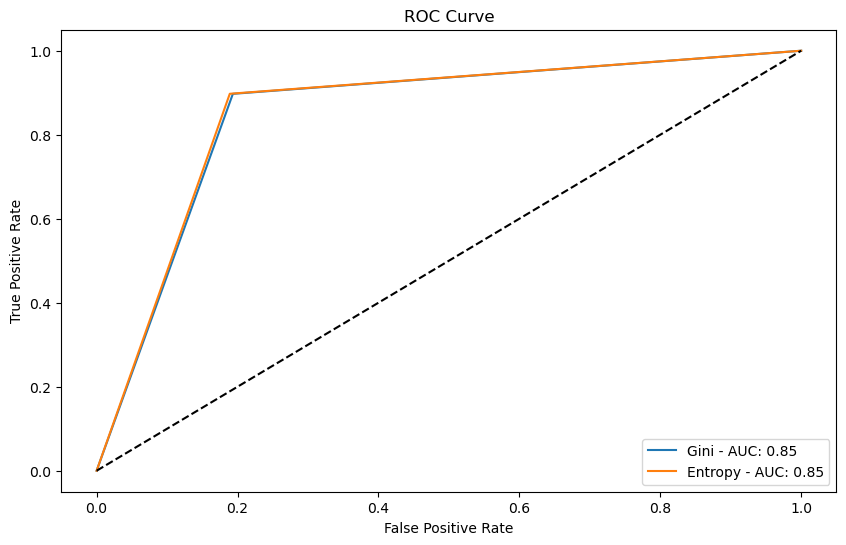

In [50]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, roc_auc_score, roc_curve

# Assuming y_test, y_pred_gini, and y_pred_entropy are already defined from your model predictions

# Evaluation metrics for Gini model
confusion_gini = confusion_matrix(y_test, y_pred_gini)
precision_gini = precision_score(y_test, y_pred_gini)
recall_gini = recall_score(y_test, y_pred_gini)
f1_score_gini = f1_score(y_test, y_pred_gini)
roc_auc_gini = roc_auc_score(y_test, y_pred_gini)

# Evaluation metrics for Entropy model
confusion_entropy = confusion_matrix(y_test, y_pred_entropy)
precision_entropy = precision_score(y_test, y_pred_entropy)
recall_entropy = recall_score(y_test, y_pred_entropy)
f1_score_entropy = f1_score(y_test, y_pred_entropy)
roc_auc_entropy = roc_auc_score(y_test, y_pred_entropy)

# Printing the evaluation metrics
print("Gini Model Evaluation Metrics:")
print("Confusion Matrix:\n", confusion_gini)
print("Precision: {:.2f}".format(precision_gini))
print("Recall: {:.2f}".format(recall_gini))
print("F1 Score: {:.2f}".format(f1_score_gini))
print("ROC AUC: {:.2f}".format(roc_auc_gini))

print("\nEntropy Model Evaluation Metrics:")
print("Confusion Matrix:\n", confusion_entropy)
print("Precision: {:.2f}".format(precision_entropy))
print("Recall: {:.2f}".format(recall_entropy))
print("F1 Score: {:.2f}".format(f1_score_entropy))
print("ROC AUC: {:.2f}".format(roc_auc_entropy))

# ROC curve calculations
fpr_gini, tpr_gini, _ = roc_curve(y_test, y_pred_gini)
fpr_entropy, tpr_entropy, _ = roc_curve(y_test, y_pred_entropy)

# Plotting ROC curves
plt.figure(figsize=(10, 6))
plt.plot(fpr_gini, tpr_gini, label='Gini - AUC: {:.2f}'.format(roc_auc_gini))
plt.plot(fpr_entropy, tpr_entropy, label='Entropy - AUC: {:.2f}'.format(roc_auc_entropy))
plt.plot([0, 1], [0, 1], 'k--') # Dashed diagonal line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

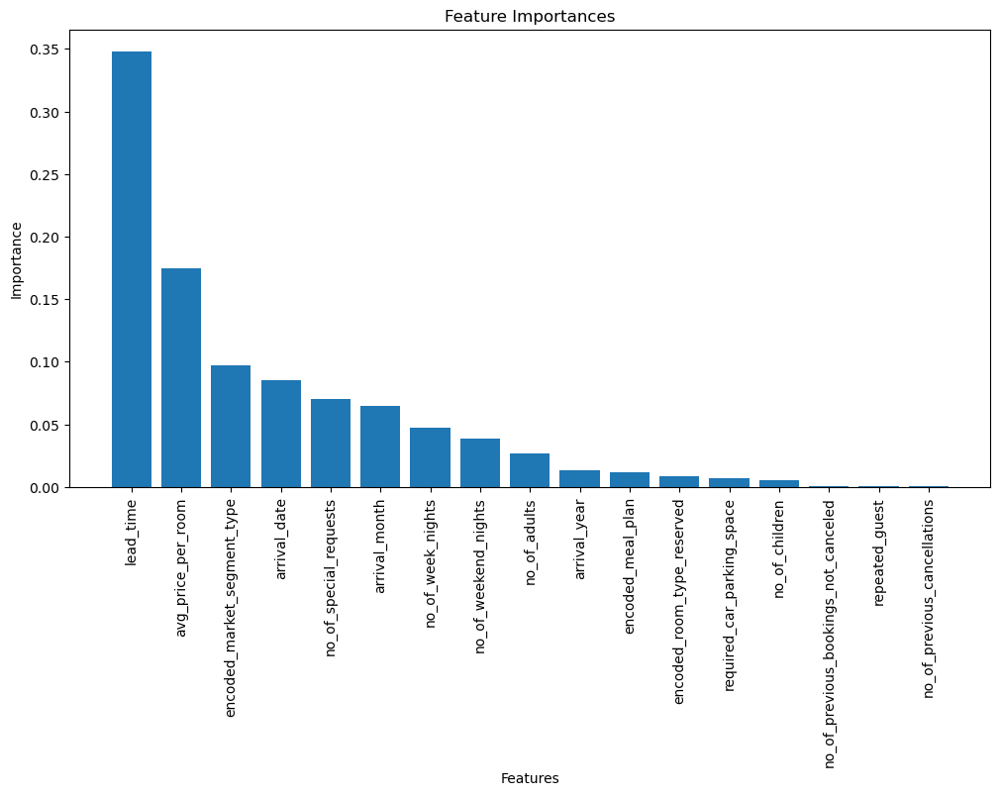

In [51]:
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have a dataset 'df_encoded' and target variable 'y'

# Train a Decision Tree Model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X, y)

# Get Feature Importances
importances = dt_model.feature_importances_

# Convert to a DataFrame
feature_importances = pd.DataFrame({'feature': X.columns, 'importance': importances})

# Sort the DataFrame by importance
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

# Visualize Feature Importances
plt.figure(figsize=(12, 6))
plt.bar(feature_importances['feature'], feature_importances['importance'])
plt.xlabel('Features')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.title('Feature Importances')
plt.show()


# What is imbalanced data?

When the distribution of label is uneven like 70 % belong to category A and 30% to Category B, then it is known as imbalanced data. 

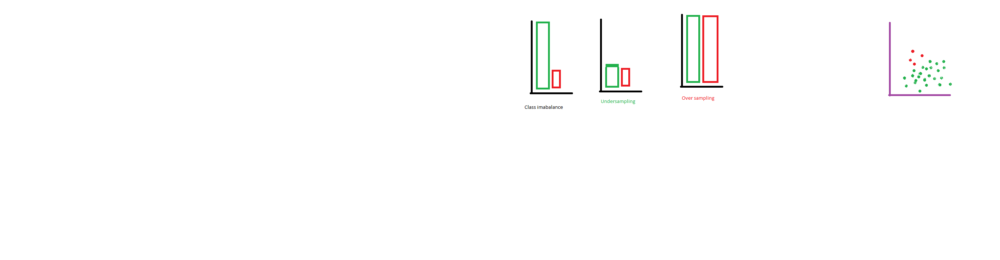

In [52]:
y_train.value_counts()

encoded_booking_status
1    17142
0     8250
Name: count, dtype: int64

    1: not cancelled
    0: cancelled

# Handling Class Imbalance with SMOTE

SMOTE (Synthetic Minority Over-sampling Technique) is a method used to address class imbalance in machine learning datasets. It works by generating synthetic samples for the minority class to balance the distribution of classes. Here's a step-by-step explanation of how SMOTE works:

1. **Identify the Minority Class:**
   - In a binary or multiclass classification problem, there is a minority class (the class with fewer instances) and a majority class (the class with more instances).

2. **Select a Minority Instance:**
   - SMOTE works by selecting individual instances from the minority class.

3. **Find Nearest Neighbors:**
   - For each selected instance, SMOTE identifies its k nearest neighbors within the minority class. The value of k is a parameter chosen by the user.

4. **Generate Synthetic Samples:**
   - Synthetic samples are created by interpolating between the selected instance and its nearest neighbors. This is done by considering the feature values of the neighbors and introducing variations.

5. **Repeat for Multiple Instances:**
   - Steps 2-4 are repeated for multiple instances from the minority class, generating a set of synthetic samples.

6. **Combine Original and Synthetic Samples:**
   - The synthetic samples are combined with the original minority class instances to create a new, balanced dataset.

In your code snippet:

```python
from imblearn.over_sampling import SMOTE

# Assuming X_train and y_train are your original feature and target datasets
smote = SMOTE()
X_sm, y_sm = smote.fit_resample(X_train, y_train)
```

- `SMOTE()` initializes the SMOTE object.
- `fit_resample` is then called on the training data (`X_train` and `y_train`). This method performs the SMOTE resampling, creating synthetic samples for the minority class to balance the class distribution.

After running this code, `X_sm` and `y_sm` will contain the resampled dataset with a balanced distribution of classes. The synthetic samples generated by SMOTE help the model learn better from the minority class, potentially improving its performance on imbalanced datasets.

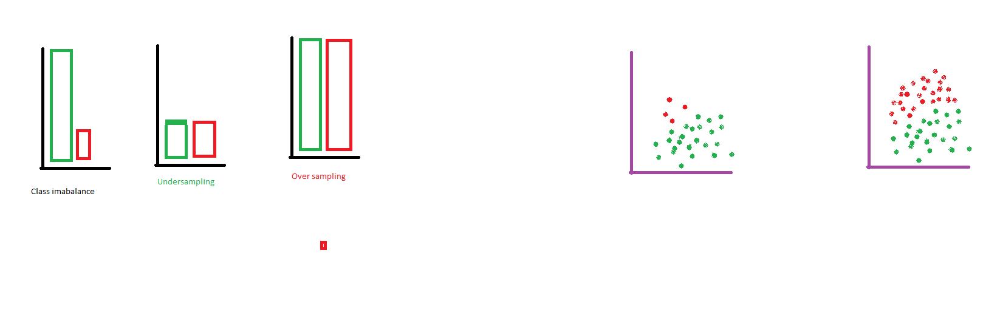

In [53]:
X_train.shape

(25392, 17)

In [55]:
from imblearn.over_sampling import SMOTE

smote = SMOTE()
X_sm, y_sm = smote.fit_resample(X_train, y_train)



In [56]:
y_train.value_counts()

encoded_booking_status
1    17142
0     8250
Name: count, dtype: int64

In [57]:
y_sm.value_counts()

encoded_booking_status
1    17142
0    17142
Name: count, dtype: int64

In [62]:
# This dataframe is just for understanding and to see the balanced data
import pandas as pd

# Concatenate features and target into a single DataFrame
df_resampled = pd.concat([pd.DataFrame(X_sm, columns=X.columns), pd.DataFrame(y_sm, columns=['encoded_booking_status'])], axis=1)

# Display the resulting DataFrame
df_resampled.head(2)

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,encoded_meal_plan,encoded_room_type_reserved,encoded_market_segment_type,encoded_booking_status
0,0.298893,-0.26147,1.365993,1.981521,-0.178819,-0.828964,0.467843,0.839242,-1.326838,-0.16221,-0.063393,-0.087456,1.413735,-0.78814,0.462120,-0.506411,0.656692,1
1,0.298893,-0.26147,-0.931190,0.563972,-0.178819,-0.479841,0.467843,-1.766747,0.160521,-0.16221,-0.063393,-0.087456,-0.810043,-0.78814,-0.491972,-0.506411,-0.810601,1


In [63]:
# KNN model
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_sm, y_sm)
y_pred_knn = knn_model.predict(X_test)
accuracy_knn = accuracy_score(y_test, y_pred_knn)

# Displaying results for KNN
print("K-Nearest Neighbors (KNN) Model:")
print(f"Accuracy: {accuracy_knn:.4f}")
print("Classification Report:")
print(classification_report(y_test, y_pred_knn))



K-Nearest Neighbors (KNN) Model:
Accuracy: 0.8292
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.83      0.77      3635
           1       0.91      0.83      0.87      7248

    accuracy                           0.83     10883
   macro avg       0.81      0.83      0.82     10883
weighted avg       0.84      0.83      0.83     10883



In [64]:

# Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_sm, y_sm)
y_pred_dt = dt_model.predict(X_test)
accuracy_dt = accuracy_score(y_test, y_pred_dt)


# Displaying results for Decision Tree
print("\nDecision Tree Model:")
print(f"Accuracy: {accuracy_dt:.4f}")
print("Classification Report:")
print(classification_report(y_test, y_pred_dt))



Decision Tree Model:
Accuracy: 0.8564
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.82      0.79      3635
           1       0.90      0.88      0.89      7248

    accuracy                           0.86     10883
   macro avg       0.84      0.85      0.84     10883
weighted avg       0.86      0.86      0.86     10883



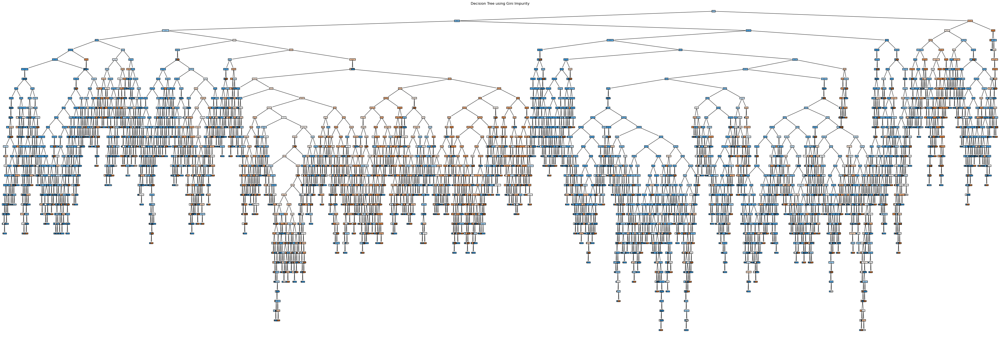

In [66]:
from sklearn.tree import plot_tree

# Visualizing the Decision Tree using Gini impurity
plt.figure(figsize=(60,20))
plot_tree(dt_gini, filled=True, feature_names=df_feat.columns, class_names=['Canceled', 'Not_Canceled'], rounded=True)
plt.title("Decision Tree using Gini Impurity") 
plt.savefig('Decision_Tree_Gini.pdf')
plt.show()
plt.close()